In [1]:
# import lib
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import codecs
import pandas as pd


In [55]:
# set param
dir_img     = './images/'
ext_img     = ['.jpg', '.jpeg', '.png']
ext_pts     = '.pts'
random_seed = 0
train_ratio = 0.7

filename_csv_train = './face_landmarks_300w_train.csv'
filename_csv_val   = './face_landmarks_300w_valid.csv'


In [29]:
# set random seed
np.random.seed(random_seed)


In [52]:
# make csv title
csv_title   = []
csv_title.append('image_name')
csv_title.append('scale')
csv_title.append('center_w')
csv_title.append('center_h')
for landmark_i in range(68):
    csv_title.append('original_%d_x' % landmark_i)
    csv_title.append('original_%d_y' % landmark_i)
csv_title = np.array(csv_title)[np.newaxis, :]
    
print(csv_title)


[['image_name' 'scale' 'center_w' 'center_h' 'original_0_x'
  'original_0_y' 'original_1_x' 'original_1_y' 'original_2_x'
  'original_2_y' 'original_3_x' 'original_3_y' 'original_4_x'
  'original_4_y' 'original_5_x' 'original_5_y' 'original_6_x'
  'original_6_y' 'original_7_x' 'original_7_y' 'original_8_x'
  'original_8_y' 'original_9_x' 'original_9_y' 'original_10_x'
  'original_10_y' 'original_11_x' 'original_11_y' 'original_12_x'
  'original_12_y' 'original_13_x' 'original_13_y' 'original_14_x'
  'original_14_y' 'original_15_x' 'original_15_y' 'original_16_x'
  'original_16_y' 'original_17_x' 'original_17_y' 'original_18_x'
  'original_18_y' 'original_19_x' 'original_19_y' 'original_20_x'
  'original_20_y' 'original_21_x' 'original_21_y' 'original_22_x'
  'original_22_y' 'original_23_x' 'original_23_y' 'original_24_x'
  'original_24_y' 'original_25_x' 'original_25_y' 'original_26_x'
  'original_26_y' 'original_27_x' 'original_27_y' 'original_28_x'
  'original_28_y' 'original_29_x' '

In [3]:
# get full path filename with specified extension
def get_full_filename_and_class_info(parent_dir, handle_ext):
    # 
    filename_stock = []
    root_stock     = []
    for (root, _, filename_list) in os.walk(parent_dir):
        root_stock.append(root)
        for filename in filename_list:
            for ext_i in range(len(handle_ext)):
                if (handle_ext[ext_i] in filename):
                    filename_stock.append(os.path.join(root, filename))
    filename_stock = np.array(filename_stock)
    filename_stock = np.sort(filename_stock)
    # 
    return (filename_stock)


In [4]:
# read image in RGB format
def imread_RGB(filename):
    # read image
    img = cv2.imread(filename)
    # convert color from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # retuan image
    return img


In [5]:
# get filename
filename_img = get_full_filename_and_class_info(dir_img, ext_img)

print(filename_img)


['./images/01_Indoor/indoor_001.png' './images/01_Indoor/indoor_002.png'
 './images/01_Indoor/indoor_003.png' './images/01_Indoor/indoor_004.png'
 './images/01_Indoor/indoor_005.png' './images/01_Indoor/indoor_006.png'
 './images/01_Indoor/indoor_007.png' './images/01_Indoor/indoor_008.png'
 './images/01_Indoor/indoor_009.png' './images/01_Indoor/indoor_010.png'
 './images/01_Indoor/indoor_011.png' './images/01_Indoor/indoor_012.png'
 './images/01_Indoor/indoor_013.png' './images/01_Indoor/indoor_014.png'
 './images/01_Indoor/indoor_015.png' './images/01_Indoor/indoor_016.png'
 './images/01_Indoor/indoor_017.png' './images/01_Indoor/indoor_018.png'
 './images/01_Indoor/indoor_019.png' './images/01_Indoor/indoor_020.png'
 './images/01_Indoor/indoor_021.png' './images/01_Indoor/indoor_022.png'
 './images/01_Indoor/indoor_023.png' './images/01_Indoor/indoor_024.png'
 './images/01_Indoor/indoor_025.png' './images/01_Indoor/indoor_026.png'
 './images/01_Indoor/indoor_027.png' './images/01_I

In [11]:
# prepare variable for output
csv_data = np.zeros([len(filename_img), len(csv_title)], dtype=np.object)

print('np.shape(csv_data) = ', end='')
print(np.shape(csv_data))
print('csv_data = ')
print(csv_data)


np.shape(csv_data) = (600, 140)
csv_data = 
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


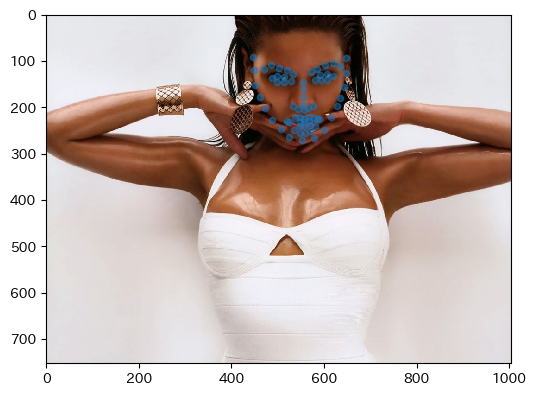

In [24]:
# test　temporary

# set index
file_i = 0

# set filename of image
filename_img_tmp = filename_img[file_i]

# read image
img_tmp = imread_RGB(filename_img_tmp)

# set filename of landmark
filename_pts_tmp = filename_img_tmp.copy()
for ext_img_i in range(len(ext_img)):
    filename_pts_tmp = filename_pts_tmp.replace(ext_img[ext_img_i], ext_pts)

# read annotation
pts_tmp = []
f       = open(filename_pts_tmp, 'r')
line    = f.readline()
while line:
    line = line.strip()
    if ((':' not in line) & 
        ('{' not in line) & 
        ('}' not in line)):
        pts_tmp.append(line.split(' '))
    line = f.readline()
f.close()
pts_tmp = np.array(pts_tmp).astype(np.float)

# calc bbox
left_x_tmp   = np.min(pts_tmp.T[0])
right_x_tmp  = np.max(pts_tmp.T[0])
top_y_tmp    = np.min(pts_tmp.T[1])
bottom_y_tmp = np.max(pts_tmp.T[1])
width_tmp    = right_x_tmp - left_x_tmp
height_tmp   = top_y_tmp - bottom_y_tmp
scale_tmp    = np.max([width_tmp, height_tmp]) / 200
center_x_tmp = left_x_tmp + (width_tmp / 2)
center_y_tmp = top_y_tmp + (height_tmp / 2)

# set to output data
csv_data[file_i, 0] = filename_img_tmp
csv_data[file_i, 1] = scale_tmp
csv_data[file_i, 2] = center_x_tmp
csv_data[file_i, 3] = center_y_tmp
for landmark_i in range(68):
    csv_data[file_i, ((landmark_i * 2) + 4)] = pts_tmp[landmark_i, 0]
    csv_data[file_i, ((landmark_i * 2) + 5)] = pts_tmp[landmark_i, 1]

# look image and landmark
plt.figure(figsize=(6,6),dpi=100)
plt.imshow(X=img_tmp, clim=[0, 255])
plt.scatter(x=csv_data[file_i, 4::2], 
            y=csv_data[file_i, 5::2], alpha=0.5, s=20)
plt.show()


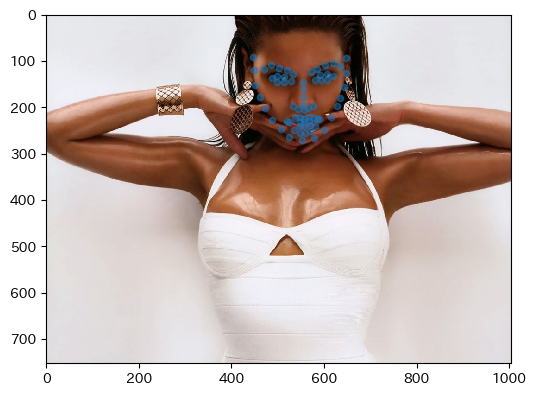

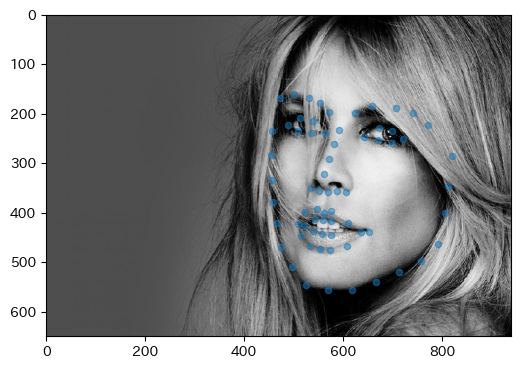

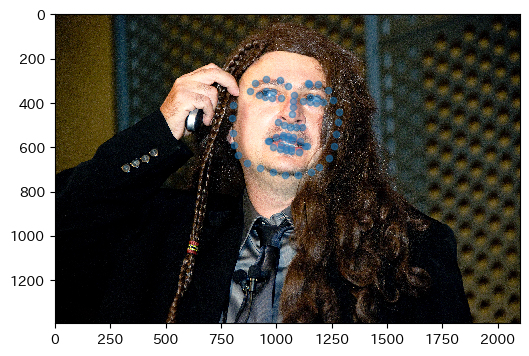

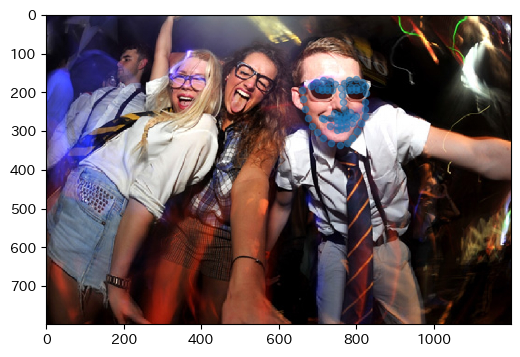

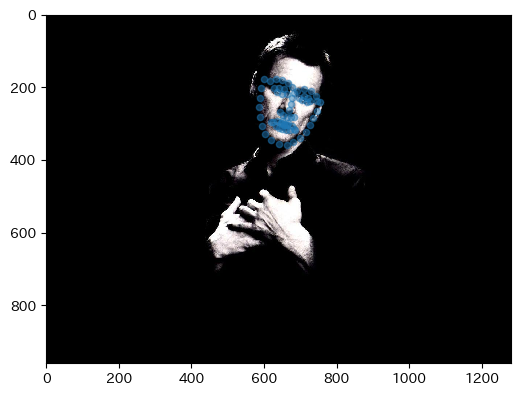

...

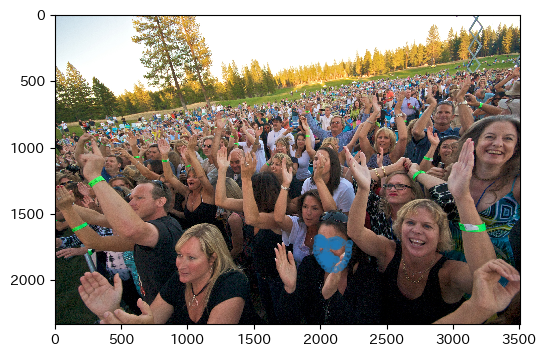

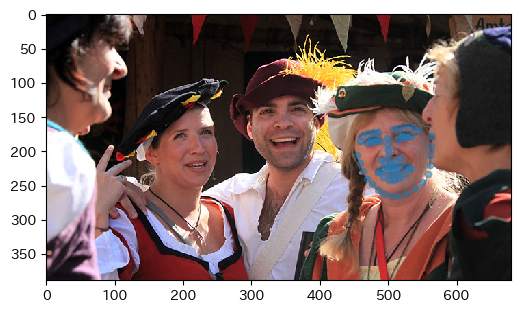

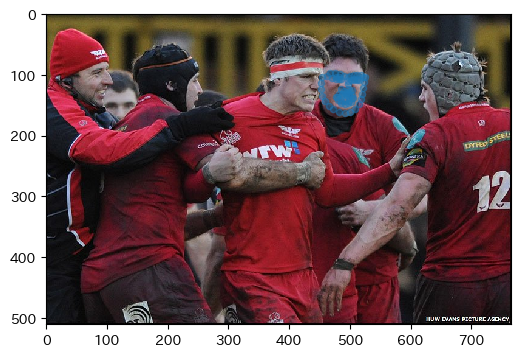

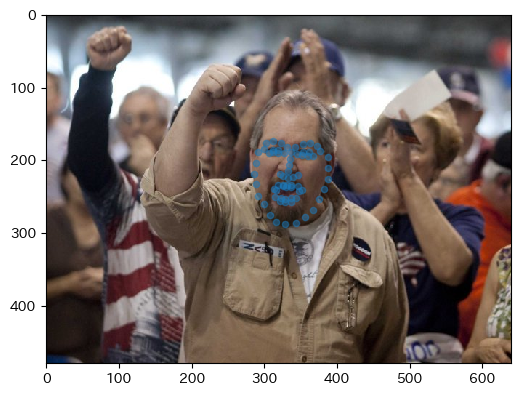

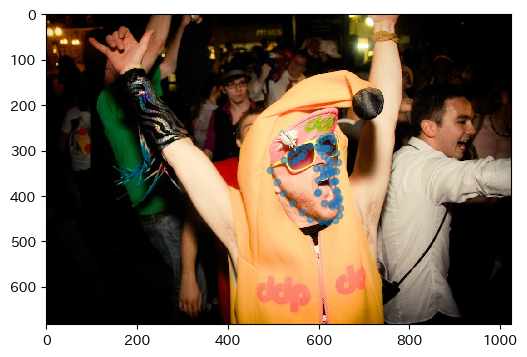

In [26]:
# loop of file
for file_i in range(len(filename_img)):

    # set filename of image
    filename_img_tmp = filename_img[file_i]

    # read image
    img_tmp = imread_RGB(filename_img_tmp)

    # set filename of landmark
    filename_pts_tmp = filename_img_tmp.copy()
    for ext_img_i in range(len(ext_img)):
        filename_pts_tmp = filename_pts_tmp.replace(ext_img[ext_img_i], ext_pts)

    # read annotation
    pts_tmp = []
    f       = open(filename_pts_tmp, 'r')
    line    = f.readline()
    while line:
        line = line.strip()
        if ((':' not in line) & 
            ('{' not in line) & 
            ('}' not in line)):
            pts_tmp.append(line.split(' '))
        line = f.readline()
    f.close()
    pts_tmp = np.array(pts_tmp).astype(np.float)

    # calc bbox
    left_x_tmp   = np.min(pts_tmp.T[0])
    right_x_tmp  = np.max(pts_tmp.T[0])
    top_y_tmp    = np.min(pts_tmp.T[1])
    bottom_y_tmp = np.max(pts_tmp.T[1])
    width_tmp    = right_x_tmp - left_x_tmp
    height_tmp   = top_y_tmp - bottom_y_tmp
    scale_tmp    = np.max([width_tmp, height_tmp]) / 200
    center_x_tmp = left_x_tmp + (width_tmp / 2)
    center_y_tmp = top_y_tmp + (height_tmp / 2)

    # set to output data
    csv_data[file_i, 0] = filename_img_tmp
    csv_data[file_i, 1] = scale_tmp
    csv_data[file_i, 2] = center_x_tmp
    csv_data[file_i, 3] = center_y_tmp
    for landmark_i in range(68):
        csv_data[file_i, ((landmark_i * 2) + 4)] = pts_tmp[landmark_i, 0]
        csv_data[file_i, ((landmark_i * 2) + 5)] = pts_tmp[landmark_i, 1]

    # view constant
    if ((file_i % 20) == 0):
        # look image and landmark
        plt.figure(figsize=(6,6),dpi=100)
        plt.imshow(X=img_tmp, clim=[0, 255])
        plt.scatter(x=csv_data[file_i, 4::2], 
                    y=csv_data[file_i, 5::2], alpha=0.5, s=20)
        plt.show()


In [37]:
# check output data
print(csv_data)


[['./images/01_Indoor/indoor_001.png' 1.00651 546.6510000000001 ...
  240.542 547.989 240.014]
 ['./images/01_Indoor/indoor_002.png' 1.594135 358.4135 ... 397.684
  358.614 395.314]
 ['./images/01_Indoor/indoor_003.png' 2.450405 611.0405000000001 ...
  539.586 544.861 534.522]
 ...
 ['./images/02_Outdoor/outdoor_298.png' 0.9946700000000002 193.467 ...
  221.785 195.67 226.229]
 ['./images/02_Outdoor/outdoor_299.png' 0.9511900000000003 472.119 ...
  318.207 494.512 317.958]
 ['./images/02_Outdoor/outdoor_300.png' 0.9145400000000001 406.454 ...
  316.91 398.867 315.169]]


In [53]:
# make_idx for split
train_idx = np.random.permutation(np.arange(len(csv_data)))
train_num = int(np.round(len(csv_data) * train_ratio))
val_idx   = train_idx[train_num:]
train_idx = train_idx[:train_num]
train_idx = np.sort(train_idx)
val_idx   = np.sort(val_idx)

# split train and validation
csv_data_train = csv_data[train_idx]
csv_data_val   = csv_data[val_idx]

# split train and validation
csv_data_train = np.concatenate([csv_title, csv_data_train], axis=0)
csv_data_val   = np.concatenate([csv_title, csv_data_val],   axis=0)

# check
print('np.shape(csv_data_train) = ', end='')
print(np.shape(csv_data_train))
print('csv_data_train = ')
print(csv_data_train)
print()
print('np.shape(csv_data_val) = ', end='')
print(np.shape(csv_data_val))
print('csv_data_val = ')
print(csv_data_val)


np.shape(csv_data_train) = (421, 140)
csv_data_train = 
[['image_name' 'scale' 'center_w' ... 'original_66_y' 'original_67_x'
  'original_67_y']
 ['./images/01_Indoor/indoor_001.png' 1.00651 546.6510000000001 ...
  240.542 547.989 240.014]
 ['./images/01_Indoor/indoor_003.png' 2.450405 611.0405000000001 ...
  539.586 544.861 534.522]
 ...
 ['./images/02_Outdoor/outdoor_297.png' 0.8273550000000001 1490.5135 ...
  538.036 1466.539 535.826]
 ['./images/02_Outdoor/outdoor_298.png' 0.9946700000000002 193.467 ...
  221.785 195.67 226.229]
 ['./images/02_Outdoor/outdoor_299.png' 0.9511900000000003 472.119 ...
  318.207 494.512 317.958]]

np.shape(csv_data_val) = (181, 140)
csv_data_val = 
[['image_name' 'scale' 'center_w' ... 'original_66_y' 'original_67_x'
  'original_67_y']
 ['./images/01_Indoor/indoor_002.png' 1.594135 358.4135 ... 397.684
  358.614 395.314]
 ['./images/01_Indoor/indoor_004.png' 1.0793450000000002 414.9345 ...
  367.069 442.256 366.952]
 ...
 ['./images/02_Outdoor/outdoor_

In [58]:
# csv output
np.savetxt(filename_csv_train, csv_data_train, fmt='%s', delimiter=',')
np.savetxt(filename_csv_val,   csv_data_val,   fmt='%s', delimiter=',')
